# Laboratory #5_1 : Object Detection with YOLO

At the end of this laboratory, you would get familiarized with

*   Object Detection
*   YOLO for Object Detection using Keras and TensorFlow

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   Add sufficient comments and explanations wherever necessary.
*   **Once you have the code completed, use GPU to train model faster.**

---

# YOLOv3 for Object Detection

*   There are several open source implementations of each version of YOLO.
*   For this exercise, we would not be implementing the YOLO from scratch as it is a challenging model and requires many customized elements.
*   We would use an open source implementation of YOLOv3 available from Python Lessons github repo, implemented with TensorFlow 2.x.
*   More details about YOLO can be found [here](https://pjreddie.com/darknet/yolo/). Refer the site and also the [paper](https://pjreddie.com/media/files/papers/YOLOv3.pdf) for better understanding.

## Clone the repo in the notebook

In [1]:
! git clone --recursive https://github.com/pythonlessons/TensorFlow-2.x-YOLOv3.git

fatal: destination path 'TensorFlow-2.x-YOLOv3' already exists and is not an empty directory.


In [2]:
# navigate to the cloned repository

%cd TensorFlow-2.x-YOLOv3/

/content/TensorFlow-2.x-YOLOv3


In [3]:
# installing additional requirements using pip

! pip install -r requirements.txt

# Please note that some libraries would return error. 
# If they are not important dependecies, you can skip those errors.
# Pip installation might require restarting the notebook. 
# Follow the installation output

## Loading pre-trained weights

*   Load the weights using any one of the methods

In [4]:
#  download the weights to the filesystem 
# (Remember that this would not be persistent)
# If you need the weights to be persistent, upload the weights to your drive
# and load from the drive

! wget -P model_data https://pjreddie.com/media/files/yolov3.weights  

--2021-12-20 20:29:25--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘model_data/yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  21.1MB/s    in 12s     

2021-12-20 20:29:38 (19.7 MB/s) - ‘model_data/yolov3.weights’ saved [248007048/248007048]



## Detecting objects in images

*   Run sample predictions using the pre-trained weights

In [5]:
from yolov3.utils import detect_image, Load_Yolo_model
from yolov3.configs import *

image_path = "./IMAGES/kite.jpg"
output_path = "./kite_pred.jpg"

yolo = Load_Yolo_model()

kite_predictions = detect_image(
    yolo, 
    image_path, 
    output_path, 
    input_size=YOLO_INPUT_SIZE, 
    show=False, 
    rectangle_colors=(255,0,0))


# You will find the predictions file saved in the output path
# all objects present in MS-COCO classes would be detected in the saved file

GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Loading Darknet_weights from: model_data/yolov3.weights


## Understanding Image Detection function

*   In this exercise, you have to write your own function for object detection (Each step would lead to replicating the existing function)

*   Load the input image and visualize the image using matplotlib
*   Please note that image read is different in matplotlib, skimage and opencv. You will need to do appropriate conversion if using opencv

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


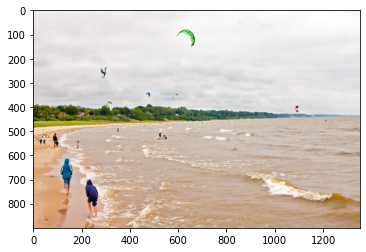

<function matplotlib.pyplot.show>

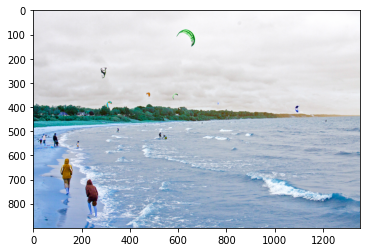

In [7]:
# solution
import io
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img2 = cv2.imread(os.path.join(image_path))

img = mpimg.imread(image_path)
plt.imshow(img)
plt.show()

plt.imshow(img2)
plt.show

*   Load the configurations

In [8]:
# open the configs.py file to understand the different configuration parameters

from yolov3.configs import *

*   Load the pre-trained weights using the Load_Yolo_model fuction available in yolov3.utils

In [9]:
from yolov3.utils import Load_Yolo_model

yolo = Load_Yolo_model()

GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Loading Darknet_weights from: model_data/yolov3.weights


*   Preprocess the image according to the network to be used

In [10]:
import numpy as np
from yolov3.utils import image_preprocess

image_data = image_preprocess(np.copy(img), [YOLO_INPUT_SIZE, YOLO_INPUT_SIZE])
image_data = image_data[np.newaxis, ...].astype(np.float32)

print('Original image:', img.shape)
print('Processed image:', image_data.shape)

Original image: (900, 1352, 3)
Processed image: (1, 416, 416, 3)


### Prediction boxes

*   Predict bounding boxes using the predict method 

In [11]:
pred_bbox = yolo.predict(image_data)

In [12]:
print(f'Number of scales in YOLO: {len(pred_bbox)}')

Number of scales in YOLO: 3


In [13]:
print(f'The shape for the first box is: {pred_bbox[0].shape}')
print(f'The shape for the second box is: {pred_bbox[1].shape}')
print(f'The shape for the third box is: {pred_bbox[2].shape}')


The shape for the first box is: (1, 52, 52, 3, 85)
The shape for the second box is: (1, 26, 26, 3, 85)
The shape for the third box is: (1, 13, 13, 3, 85)


*   Get the prediction statistics

In [14]:
print('Length of the prediction boxes =', len(pred_bbox))
print('Shape of each prediction box ')

for i in range(len(pred_bbox)):
    print('Shape of prediction box', i, 'is', pred_bbox[i].shape)

Length of the prediction boxes = 3
Shape of each prediction box 
Shape of prediction box 0 is (1, 52, 52, 3, 85)
Shape of prediction box 1 is (1, 26, 26, 3, 85)
Shape of prediction box 2 is (1, 13, 13, 3, 85)


*   Why is the length of prediction boxes 3?

**Solution**

*The algorithm YOLOv3 have 3 prediction boxes in different scales because in that predictions extract the features in pyramids networks way, and as is mentioned in the paper predict 3 boxes for 4 bounding box offsets and for 80 class predictions in 1 objectness, with that We can achieve that after performing a convolution for the first scale, this prediction is used to improve the next scale and thus consecutively for the third, reaching great performance in detecting objects.*


*   What does the shape of each prediction box represent?
*   Which layer corresponds to each prediction box output?

**Solution**

*The shape of each prediction means that each scale has different sizes. Also, we can observe that the first scale is bigger than the others, in this scale the algorithm predict and detect objects in the input with a similar scale, this prediction can help the follow to predict the object on a smaller scale, and this new prediction help to the last and the most small scale, that helps the algorithm to detect the objects that are located in the deeper position in the image.*

- First layer: 52,52,3,85
- Second layer: 26,26,3,85
- Third layer: 13,13,3,85*

Alsothe layer that corresponds to the each prediction box output is the FC on top of the convolutional neural network feature extractor.

...

*   What does 85 represent in the last dimension of the prediction box shape?

**Solution**

*The number 85 represents the following:
- 4 bounding boz offsets
- 80 class predictions
- 1 objectness prediction*

...

*   What is the aim in having three prediction boxes array?
*   Why is it helpful?

**Solution**

*The purpose of having three prediction boxes array is to detect the object in different sizes and objects, this is helpful in this way because the last bigger box prediction helps the others to increase its performance in the minor scales by filtering if they have an overlap or low score. Also, because this can help the prediction boxes to be reshape. *

...

*   Reshape the prediction boxes

In [15]:
import tensorflow as tf

pred_bbox = [tf.reshape(x, (-1, tf.shape(x)[-1])) for x in pred_bbox]
pred_bbox = tf.concat(pred_bbox, axis=0)

print(pred_bbox.shape)

(10647, 85)


*   What do you think happens in the previous cell (reshaping the prediction boxes)? Explain the code as per your understanding.
*   Why do you think this step is needed?

**Solution**

*We have different sizes predetermined in the prediction boxes, otherwise, these predictions are stored in a list that contains three different matrices. In this step, we are reducing the shape of this array or in other words, we are flattening this list, this step is needed because as we know, before is divided the image into s X s, there will be multiple bounding boxes for the anchor boxes and then we have the boxes predictes, we need to reshape in the width and height previusly predicted for each objectnes detect, in other words, we are flatten. With this step we can let the dimension right to pass into the next layer.*

...

*   What are anchor boxes? What is the significance of anchor boxes in YOLO?

**Solution**

*Anchor boxes are a set of predefined bounding boxes of a certain height and width. These boxes are defined to capture the scale and aspect ratio of specific object classes.*

*Anchors are determined by a k-means procedure, looking at all the bounding boxes in your dataset.  For YOLO, the significance of anchor boxes is to predicts the offset of the tx,tw,pw, the coordinates bx,by, bw and bh of the grid.*

...

*   Post process the prediction bounding boxes

In [31]:
from yolov3.utils import postprocess_boxes

score_threshold = 0.3

bboxes = postprocess_boxes(pred_bbox, img, YOLO_INPUT_SIZE, score_threshold)

In [32]:
len(bboxes)

21

*   What is score threshold? What is the role of score threshold?

**Solution**

*The threshold governs the choice to turn a projected probability or scores into a class label, in simples word, let to us how many boxes we will see. *

...

*   What happens when the score_threshold is low? What happens when it is high?

**Solution**

*When the threshold value is low the class that was classified for that object only bellow in some parameter but probably not is correct for us, on other hand, when the value is high, is likely the correct class classified and with that we can see the bounding boxes. This is a metric to show more or less boundung boxes.*

...

### Non-maximum Supression

*   What is non-maximum supression? Why is it needed?
*   What happens in this step?

**Solution**

*Non Maximum Suppression (NMS) is a technique used in numerous computer vision tasks. It is a class of algorithms to select one entity (e.g., bounding boxes) out of many overlapping entities. We can choose the selection criteria to arrive at the desired results.

The purpose of non-max suppression is to select the best bounding box for an object and reject or “suppress” all other bounding boxes. The NMS takes two things into account. The objectiveness score is given by the model. The overlap or IOU of the bounding boxes.*

...

*   Apply NMS on the bounding boxes.

In [34]:
from yolov3.utils import nms
iou_threshold = 0.45
bboxes = nms(bboxes, iou_threshold, method='nms')

In [33]:
bboxes_2 = bboxes
print(bboxes_2)

[[5.95537415e+02 8.42689743e+01 6.68409668e+02 1.57360947e+02
  7.60482550e-01 3.30000000e+01]
 [5.93080750e+02 8.33775787e+01 6.68723999e+02 1.57646088e+02
  9.69631612e-01 3.30000000e+01]
 [2.80372650e+02 2.36899506e+02 3.05005615e+02 2.81196320e+02
  8.51100206e-01 3.30000000e+01]
 [4.66854034e+02 3.39491821e+02 4.85991211e+02 3.59207642e+02
  7.21534312e-01 3.30000000e+01]
 [5.76546509e+02 3.46895996e+02 5.97747253e+02 3.66409302e+02
  7.92833567e-01 3.30000000e+01]
 [3.07202576e+02 3.78353058e+02 3.26857452e+02 3.96937714e+02
  8.32848787e-01 3.30000000e+01]
 [7.62572998e+02 3.81706787e+02 7.72035156e+02 3.91527130e+02
  4.88466918e-01 3.30000000e+01]
 [1.07998877e+03 3.96301147e+02 1.09997083e+03 4.20084198e+02
  7.37911224e-01 3.30000000e+01]
 [1.08371582e+03 3.96022156e+02 1.10216882e+03 4.19571930e+02
  4.08652902e-01 3.30000000e+01]
 [6.94958557e+02 4.63589050e+02 7.00358582e+02 4.71010651e+02
  5.21114469e-01 0.00000000e+00]
 [3.46826935e+02 4.88865326e+02 3.56172791e+02 5.0

*   What is the role of IoU Threshold? What happens when a IoU higher threshold is used?

**Solution**

*IoU = Area of the intersection / Area of the union, i.e. IoU = Area of yellow box / Area of green box. If IoU is greater than 0.5, we can say that the prediction is good enough.The IOU threshold gives us the intersection over the union and the model can draw the bounding boxes around the given object that needs to be detected, when the value of the IoU is higher means that we will have more bounding boxes.*

...

In [35]:
#  draw the predicted bounding boxes on the image

from yolov3.utils import draw_bbox

pred_image = draw_bbox(img, bboxes, CLASSES=YOLO_COCO_CLASSES, rectangle_colors='')

### Predicting output

*   Visualize the pred_image using matplotlib

(900, 1352, 3)


Text(0.5, 1.0, 'Predicted Bounding Boxes for objectness detected')

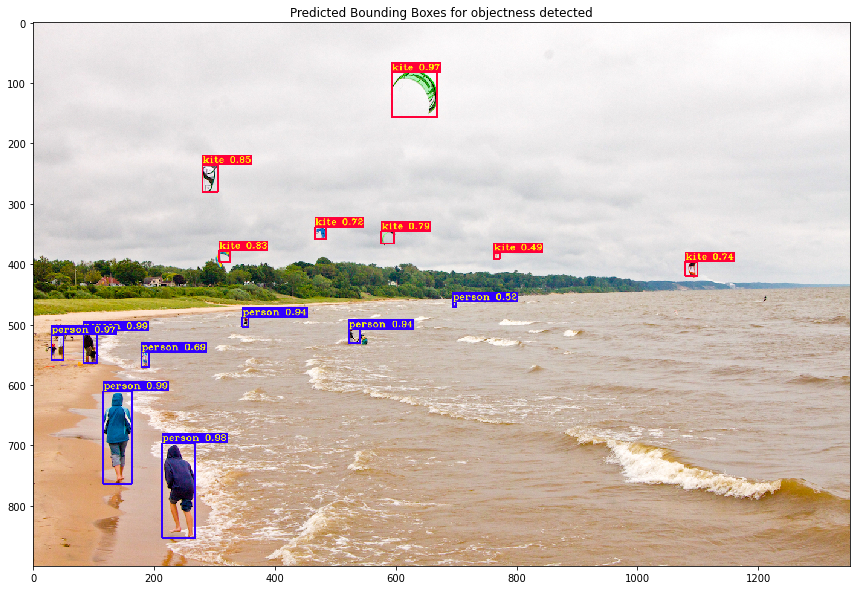

In [37]:
# solution
print(pred_image.shape)
#plt.imshow(pred_image,figsize=())

plt.figure(figsize = (20,10))
plt.imshow(pred_image, interpolation='nearest')
plt.title('Predicted Bounding Boxes for objectness detected')

# YOLO training

*   In this exercise, the task is to train mnist dataset using YOLOv3-Tiny model
*   Load the YOLOv3-Tiny weights using any one of the methods
*   For this experiment, we would use MNIST as the training data
*   Please note that all the necessary code is already available in the repo

In [38]:
# download the weights to the filesystem 
# (Remember that this would not be persistent)

! wget -P model_data https://pjreddie.com/media/files/yolov3-tiny.weights

--2021-12-20 21:33:45--  https://pjreddie.com/media/files/yolov3-tiny.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35434956 (34M) [application/octet-stream]
Saving to: ‘model_data/yolov3-tiny.weights’

yolov3-tiny.weights 100%[===================>]  33.79M   786KB/s    in 35s     

2021-12-20 21:34:21 (1000 KB/s) - ‘model_data/yolov3-tiny.weights’ saved [35434956/35434956]



### Prepare data

*   The model takes a long time to train even with GPU. In order to fasten the training process, let us change the number of training and testing images in **mnist/make_data.py** file.
```
images_num_train = 500  # line number 20 in make_data.py
images_num_test = 50  # line number 21 in make_data.py
```
*   PS: 
    *   The dataset is already available in the repository.
    *   The file can be opened by double clicking on the filename from the Files menu.


*   Prepare the dataset for training

In [41]:
! python mnist/make_data.py

=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000001.jpg 32,198,46,212,2 98,111,140,153,9 326,64,354,92,6 356,184,398,226,3 248,188,304,244,3 147,185,189,227,7
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000002.jpg 190,47,212,69,5 211,235,233,257,9 380,203,394,217,4 311,240,395,324,8
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000003.jpg 166,0,188,22,5 129,257,171,299,5 17,302,101,386,7
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000004.jpg 311,31,325,45,7 296,361,318,383,0 263,190,291,218,9 73,53,185,165,4 100,228,212,340,7 247,96,331,180,7
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000005.jpg 372,100,394,122,0 198,244,212,258,0 68,370,90,392,8 219,310,261,352,8 144,16,186,58,7 248,233,304,289,6 213,91,255,133,9 209,7,293,91,8 6,209,90,293,5 147,146,231,230,9
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000006.jpg 116,285,138,307,2 299,246,327,274,1 315,180,357,222,0 142,44,170,72,5 77,313,105,341,6 38,222,80,264,2 300,107,342,149,7 63,117

### Tensorboard Visualization

*   Tensorboard is a visualization toolkit that allows for tracking and visualizing metrics such as loss and accuracy.
*   We would get introduced to tensorboard visualization here.
*   More information can be seen [here](https://www.tensorflow.org/tensorboard)

In [42]:
# Load the TensorBoard notebook extension

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Train the network

*   Change the following train options in the **configs.py** file in the yolov3 folder
```
TRAIN_YOLO_TINY = True
# Replace the batch size with smaller number if the GPU size is not sufficient 
TRAIN_BATCH_SIZE = 128
# Replace the train epochs with smaller number for faster training
TRAIN_EPOCHS = 50
```



*   Train the model using MNIST dataset

In [43]:
! python train.py

2021-12-20 21:43:26.766545: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-12-20 21:43:28.502191: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN)to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-12-20 21:43:28.510952: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2299995000 Hz
2021-12-20 21:43:28.511181: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x55754b624680 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2021-12-20 21:43:28.511217: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2021-12-20 21:43:28.513333: I tensorflow/stream_executor/platform/default/d

*   If your tensorboard does not load, try to follow the following gif.

![](https://i.stack.imgur.com/ENl6b.gif)

In [46]:
# Visualize the training curves
# you can find the different loss curves by selecting custom scalars option
# in the top right drop down
!pip install -U tensorboard-plugin-profile
%tensorboard --logdir /content/TensorFlow-2.x-YOLOv3/log/


Output hidden; open in https://colab.research.google.com to view.

*   Explain the loss used in YOLOv3

**Solution**

*In YOLO we can split the loss function in the localization loss, classification and confindence loss.*

- For the first, is measured the quality of the predicted bounding box center and the ground truth center, also the difference in box sizes and shapes.

- For the second, is measure the quality of the object classification, for every grid that  contains a ground truth box.

- For the last is measure the sensitivity of detection, the difference between Ci and Ci_predicted.

### Predicting objects

*   Change the following option in the **detect_mnist.py** 
```
ID = random.randint(0, 50)  # depending on the number of images in test set
```
*   Change the following train options in the **configs.py** 
```
TRAIN_MODEL_NAME = f"{YOLO_TYPE}_custom_Tiny"
```

*   Run the detction script to find the outut

In [47]:
! python detect_mnist.py

# You will find the predictions file saved in the output path

2021-12-20 21:48:42.929685: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-12-20 21:48:44.753491: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2021-12-20 21:48:44.758950: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-20 21:48:44.759383: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-12-20 21:48:44.759432: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-12-20 21:48:44.761330: I tensorflow/stream_executor/platform/defa

# Understanding Object Detection

*   What is the latest YOLO version available in literature? From the initial versions to the current version, what differences are made in each version?

**Solution**

*the 4th generation of YOLO has been released in April 2020 but currently the last version is YOLOv5. 

Difference in each version:
- YOLO: For this version was used a single detector(SSD), this means that had object clasiffication and detection in a single pass of the network. Also, the bounding boxes and identifying class labels end to end was used here for first time.

- YOLOv2: In this version, was added the batchNormalization layer and the boxes in the NN,also, the architecture was restructured, because the higher resolution of the images. Darknet-19 was used here.

- YOLOv3: In this version, was imitated the residual networks layers imitating the resnet, also the new for this version was the capacity of create predictions for different level of granularity and the objecness to bounding boxes.

- YOLOv4: This version as we can appreciate the feature agregation and mish activation was improved  a lot, and the concept of real-time for detection was its strong, all of this in a simple GPU. It has 53 convolutional layers in others words Darknet-53, the procces in this version is smaller consider the previus version and in advantage we have less time to predict in other worsd the real time. The backbone was based on 'DenseNet'.Other adittion was, the Cross mini-Batch Normalization, DropBlock Regularization and DioU NMS.

- YOLOv5: For this version I can't find the oficcial paper but some information that I found said that was decreased the model size and at the same time increased the performance. This model is writtining in adapting and optimize in Pytorch.

*

...

*   What are the other object detection frameworks available in the literature? 
*   How different are they compared with YOLO?

**Solution**
The big diffference in many of the next frameworks with YOLO is the size of the steps in the algorithm, with that require multiple time and steps using the neural network. On other hand, YOLO is fast and the difference is because the other frameworks don't use SSD.

*Another frameworks used for object detection:
- CenterMask
- EfficientDet
- ASFF
- ATSS*

...

*    What is the underlying algorithm behind YOLO? Explain each stage briefly.

**Solution**

*Use a CNN for detect objects in real-time, also is implemented a forward propagation  through the neural network.

The algorithm contain a residual blocks that divide the image into various grids 'S X S', also the bounding box use regresion that is useful to detected wrt the ground truth and predict the class. Another secret to success in this algorithm is the intersection over union and with this we can meassure how efficient and at the same time by the objectness score, we can  reduce the number of bounding boxes and best fit one.*

...

*   Explain the network architecture used in training YOLO

**Solution**

*In YOLO, the architecture use a Darknet-53 with backbone, that's mean that have 53 convolutional layers,also the size of the first convolutional layers is 3x3 and the filters is 32 and for the output have 1024 filters, the global size is 1000 and start with 2 convolutional layers of 3x3, them have another 2 layers with the same characteristcis but have a residual in the end, later have 2 layers more with 64 filters and 128 filters acompained for a residual.

Them, have a convolutional layer with 256 filter and later another 9 layers with128 and 256 filter each of them acompained for the residual, them have one layer of 512 and the last 8 layers is copy again.

At the final have 4 CC with 512 and 1024 acompained in the top with avgpool with full conected and a softmax. *

...

*   What are the drawbacks in object detection frameworks?

**Solution**

* 
  - object classification and localization
  - Speed for real-time detection 
  - Multiple spatial scales and aspect ratios
  - Multiple feature maps
  - Limited data
  - Class imbalance
  - Large model calculations 
  - Complex in architectures and the size on all of them
  *

...


---

# **End of P5_1: Object Detection with YOLO**
Deadline for P5_1 submission in CampusVirtual is: **Monday, the 20th of December, 2021**